Data from Train_data_12.csv for front
Plot for front :


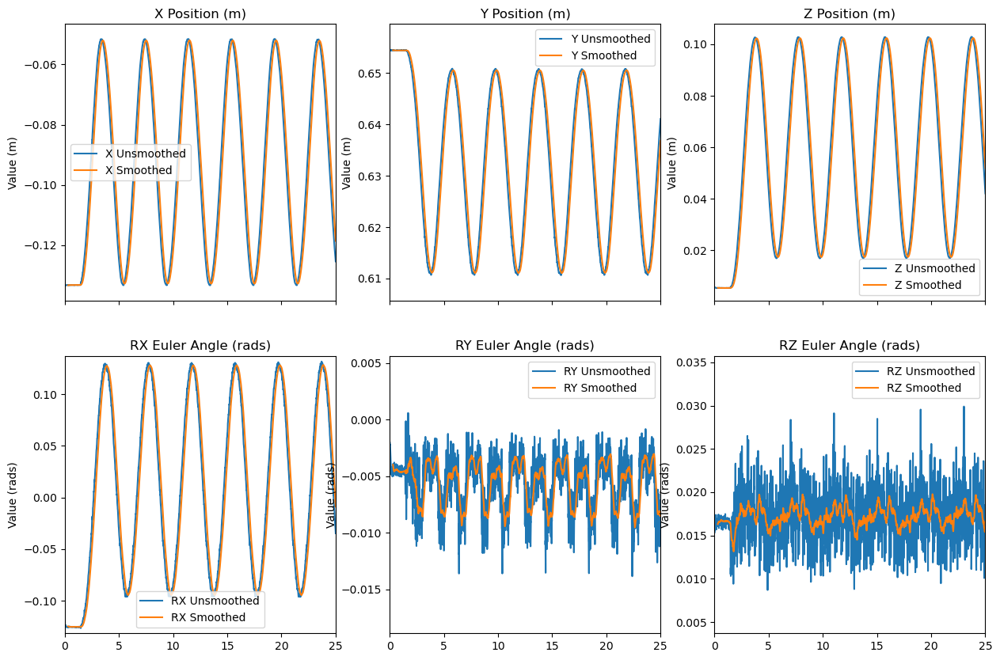

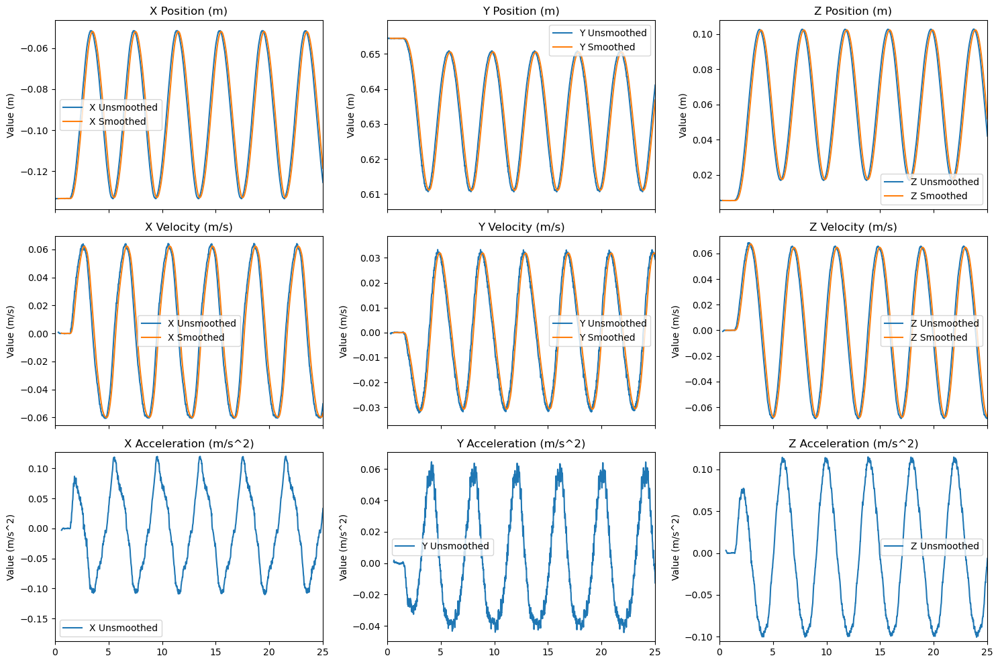

Number of data points in file : 12520
Data from Train_data_12.csv for left_rear
Plot for left_rear :


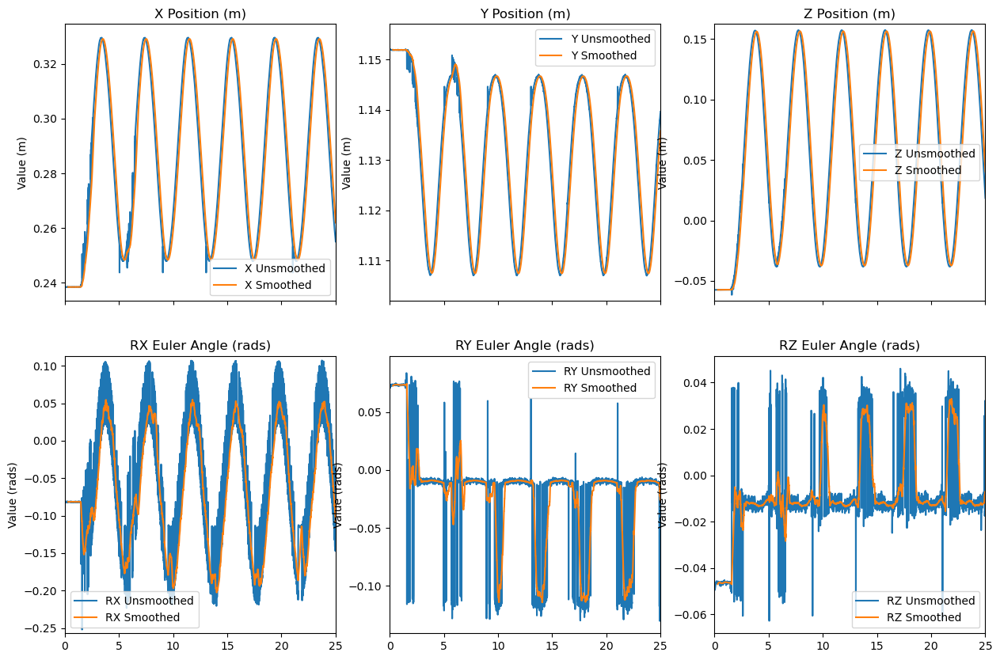

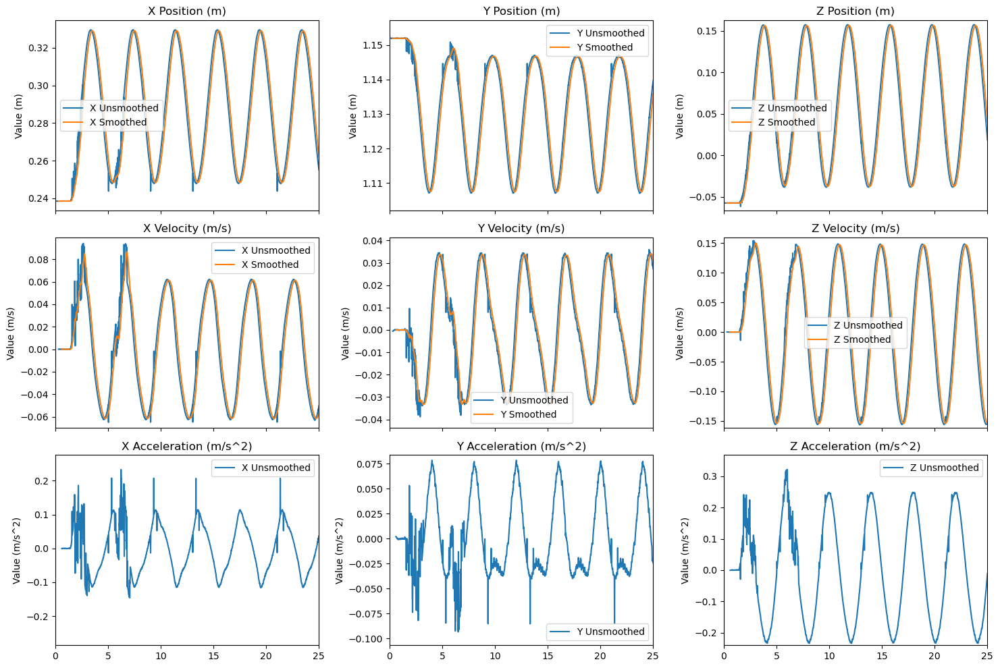

Number of data points in file : 12520
Data from Train_data_12.csv for right_rear
Plot for right_rear :


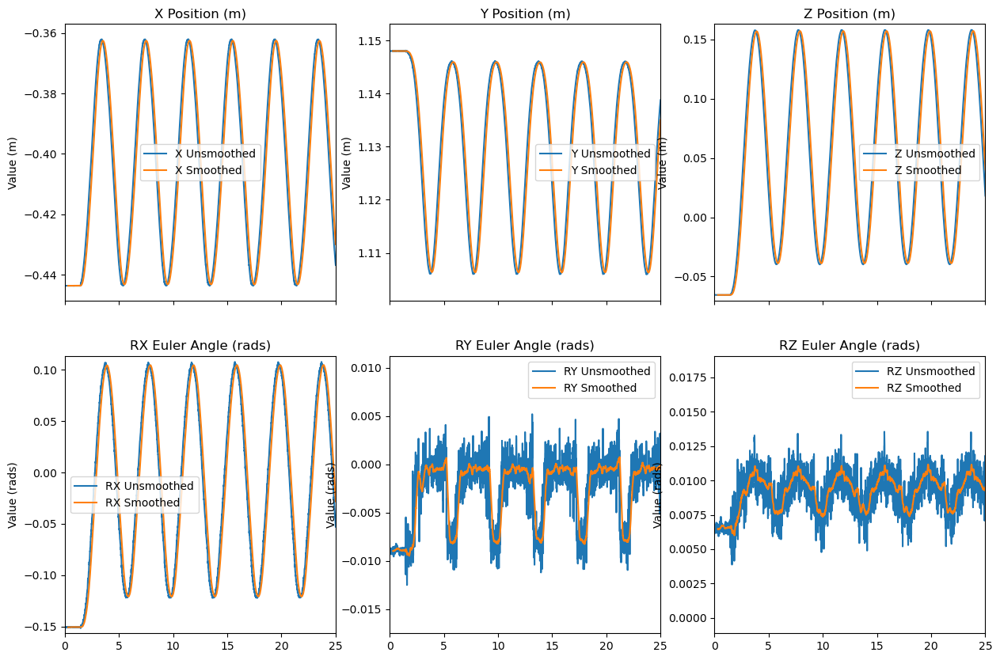

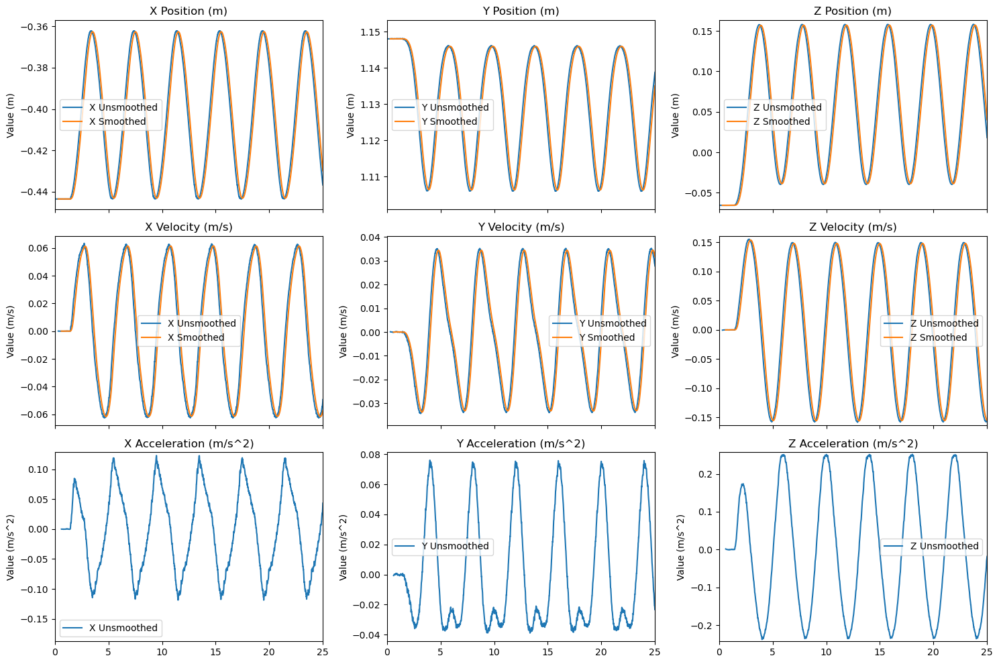

Number of data points in file : 12520
Data from Train_data_23.csv for front
Plot for front :


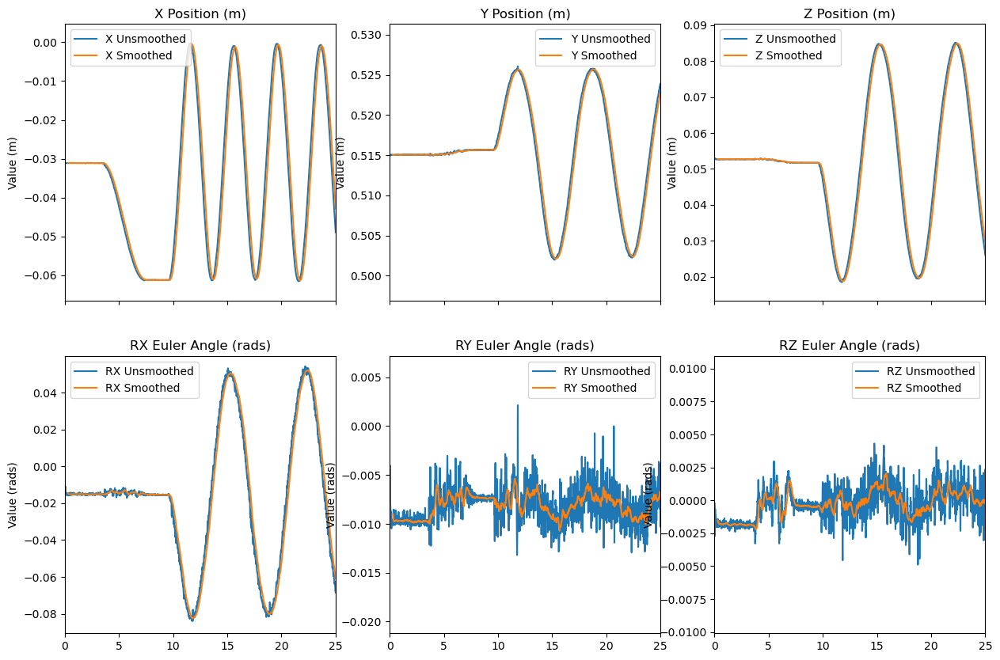

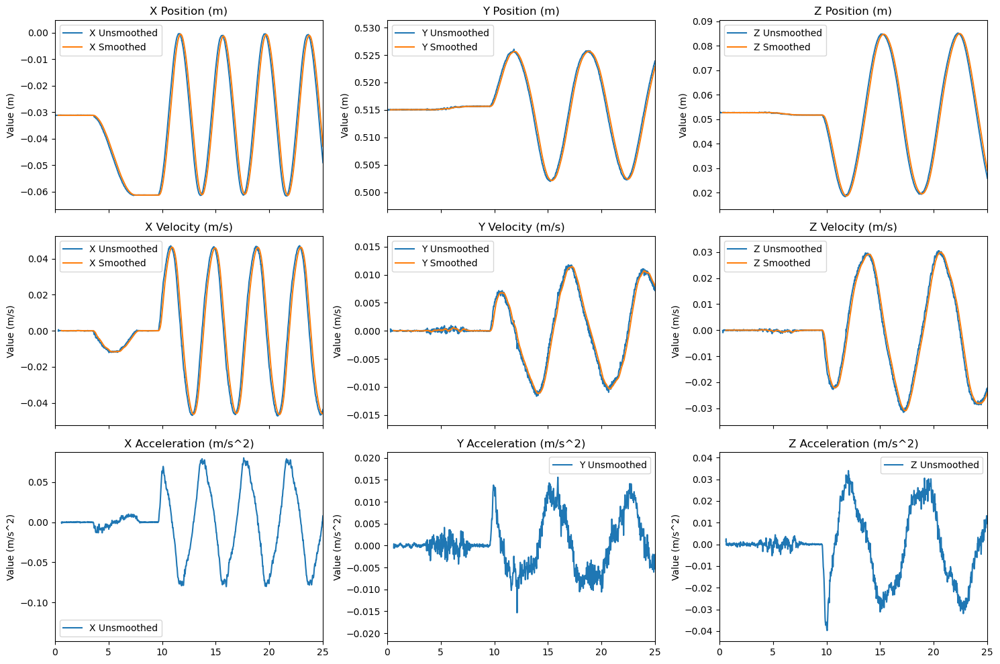

Number of data points in file : 13578
Data from Train_data_23.csv for left_rear
Plot for left_rear :


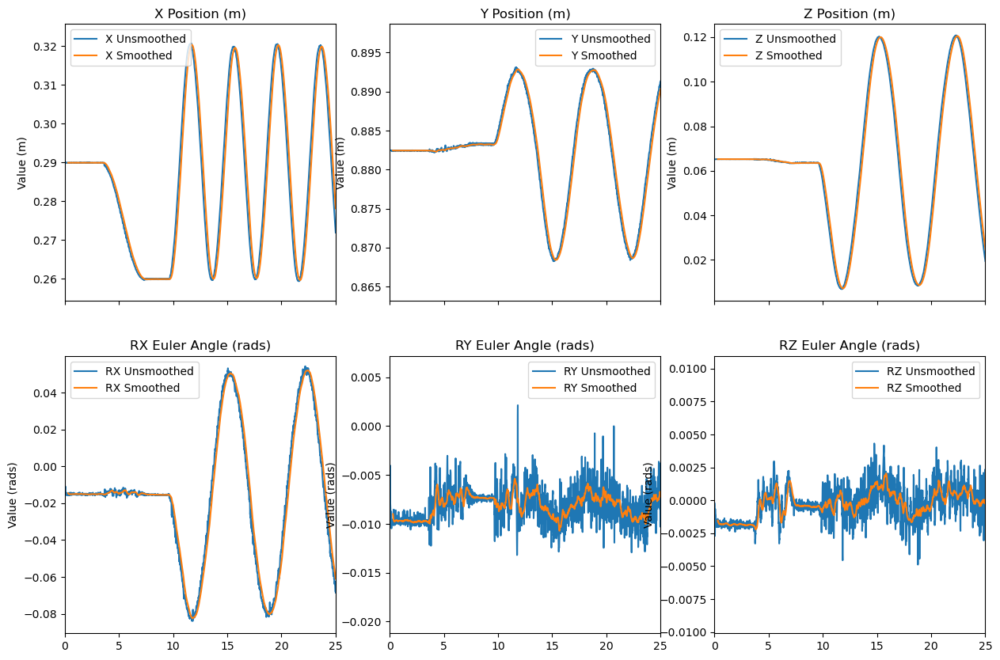

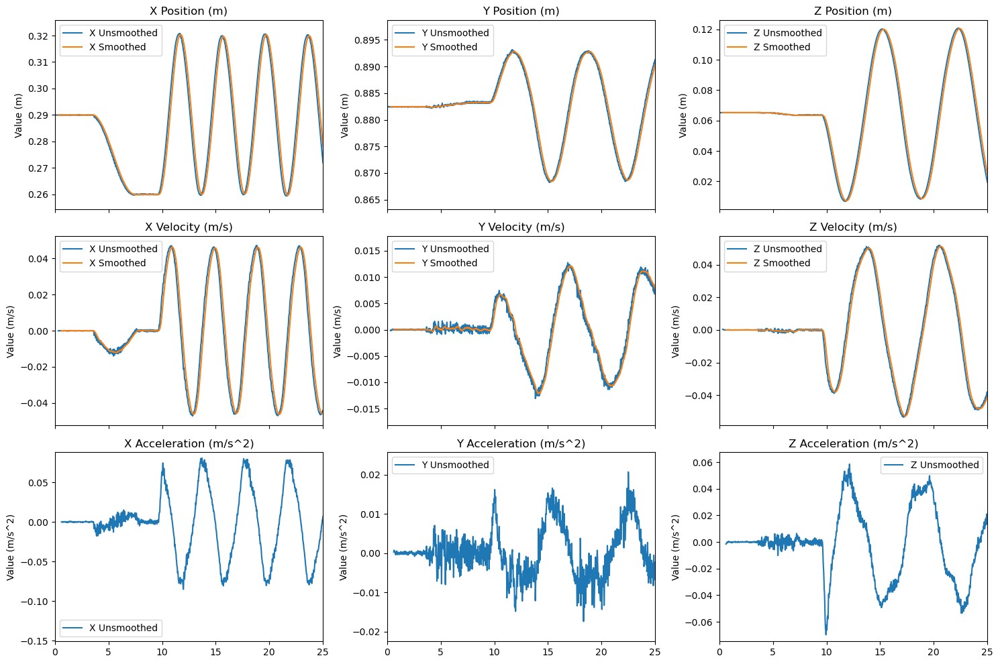

Number of data points in file : 13578
Data from Train_data_23.csv for right_rear
Plot for right_rear :


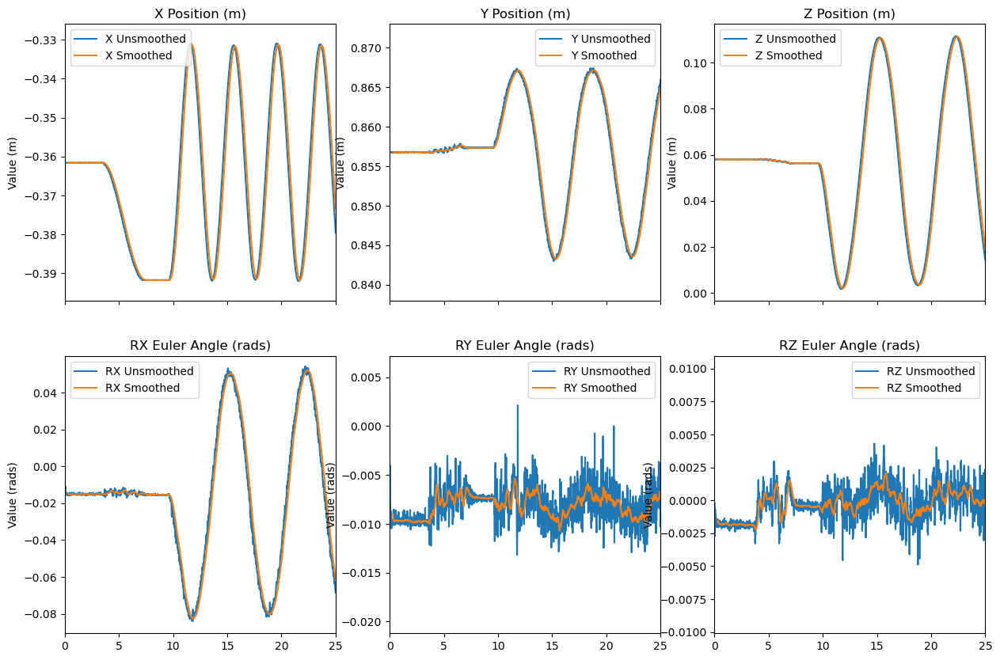

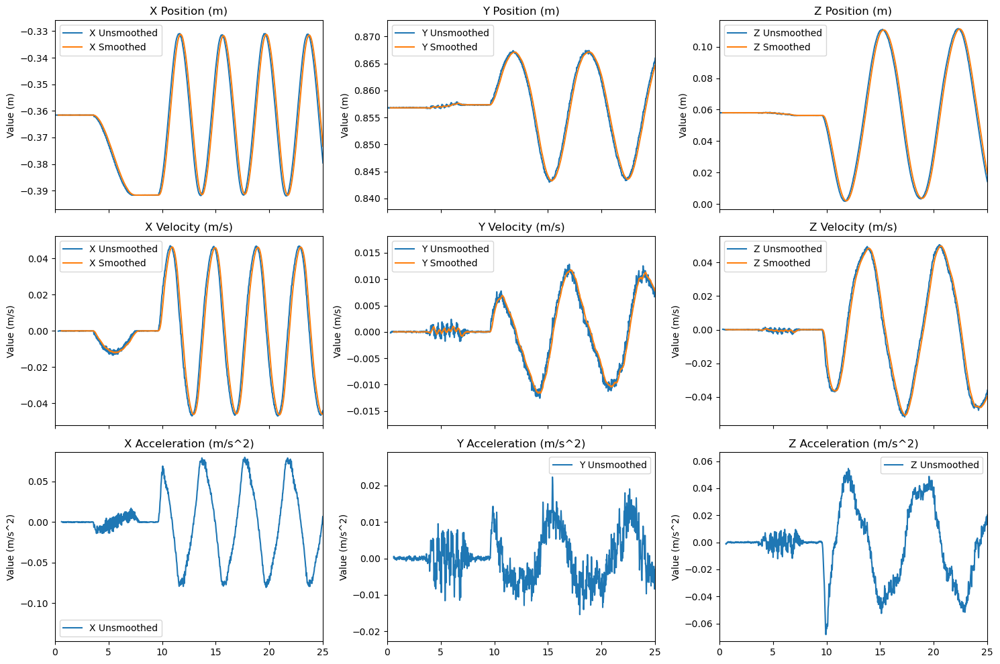

Number of data points in file : 13578
Data from Train_data_19.csv for front
Plot for front :


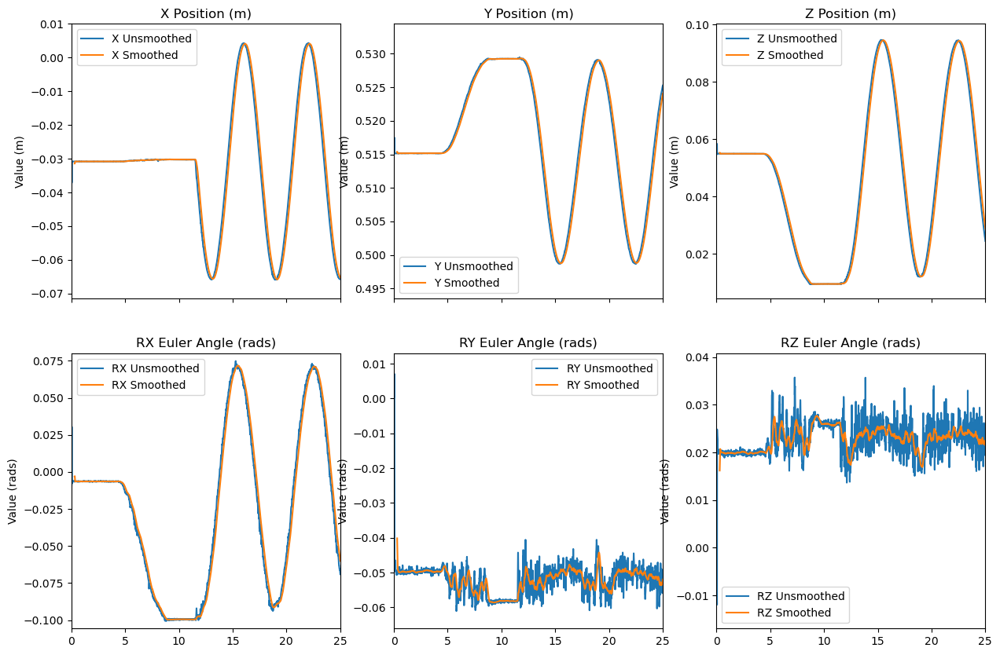

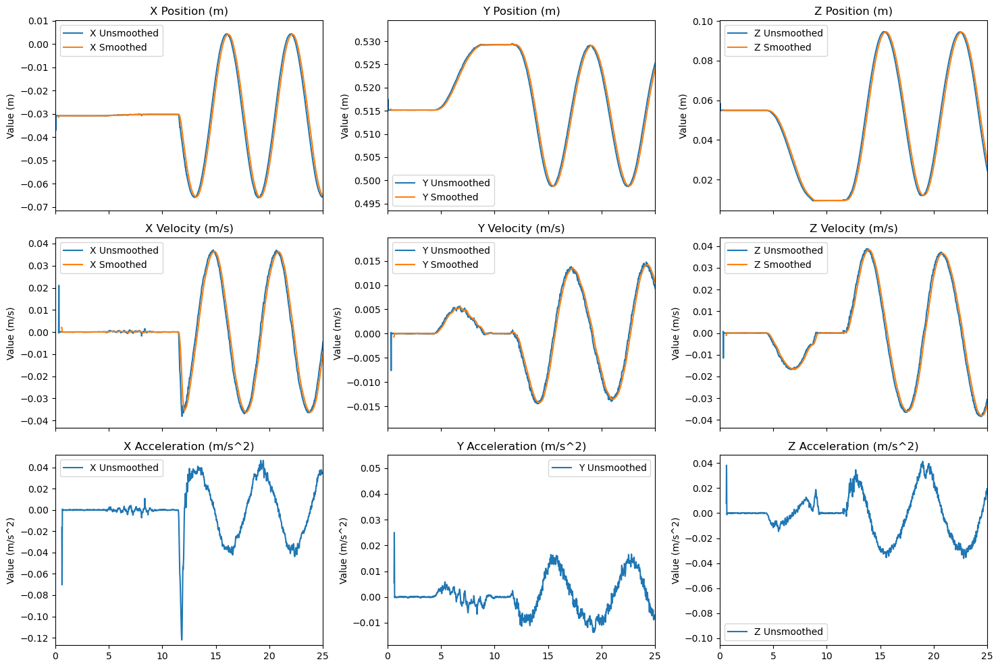

Number of data points in file : 14141
Data from Train_data_19.csv for left_rear
Plot for left_rear :


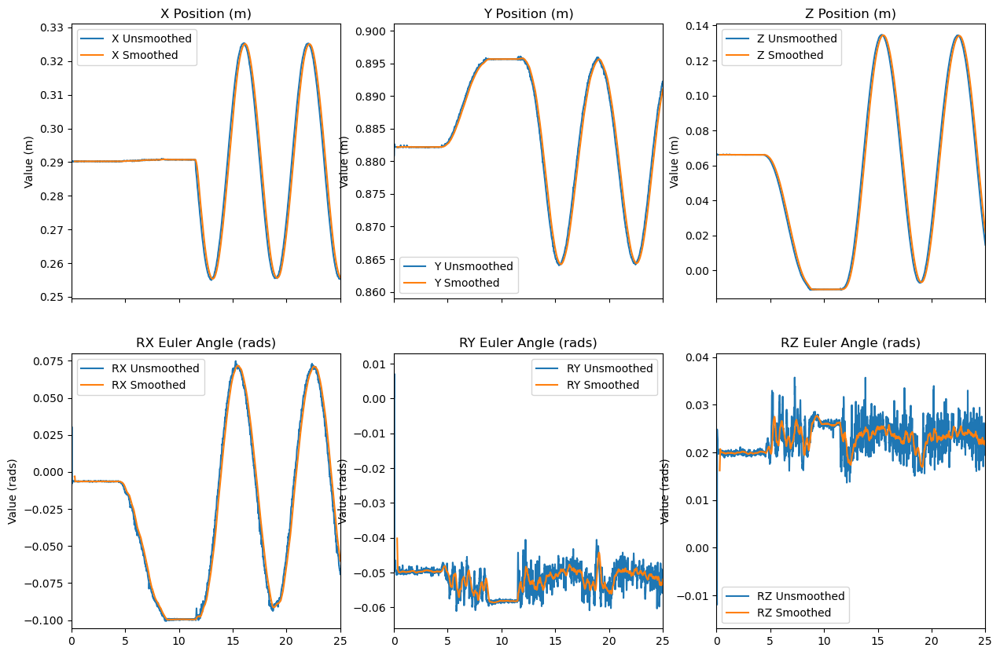

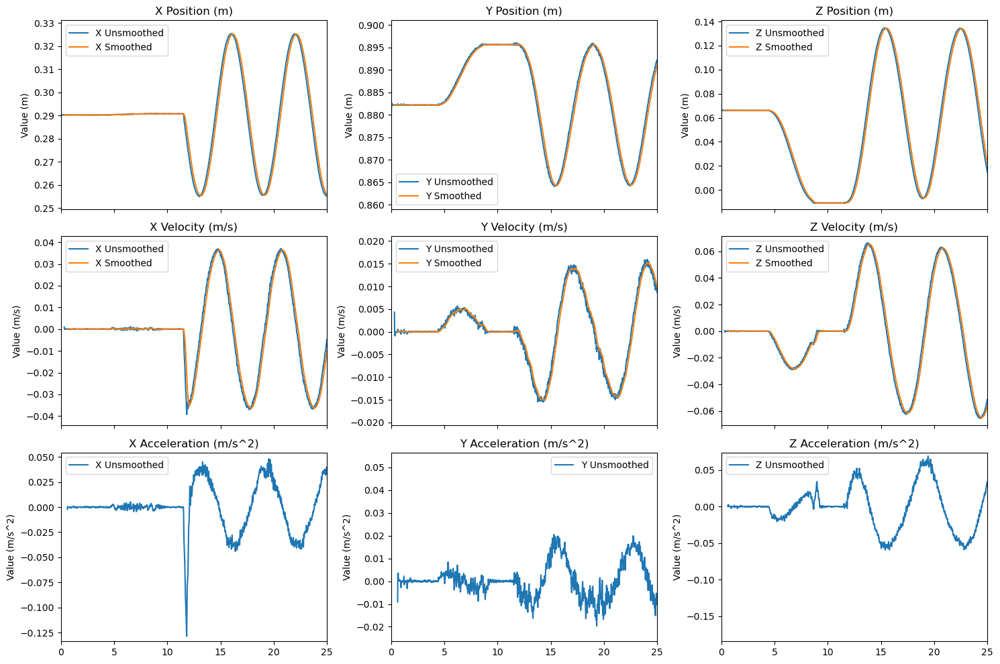

Number of data points in file : 14141
Data from Train_data_19.csv for right_rear
Plot for right_rear :


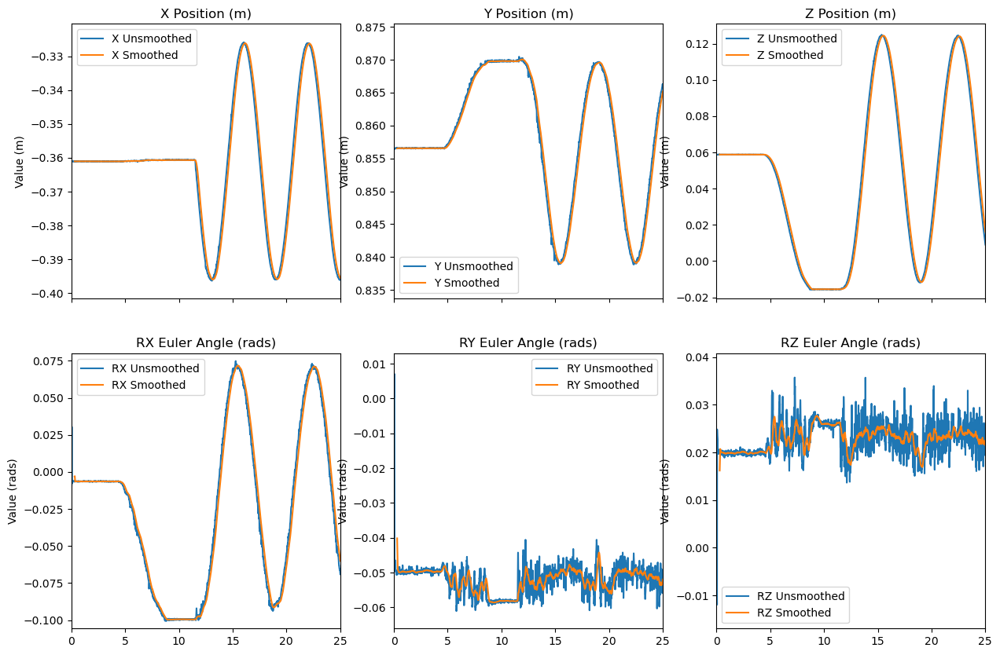

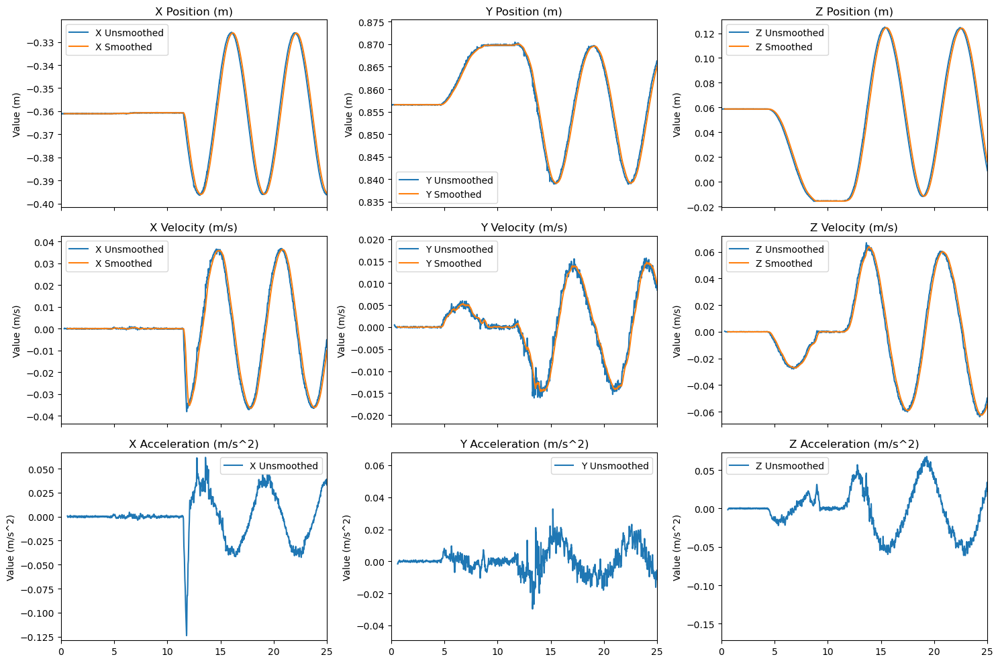

Number of data points in file : 14141
Data from Train_data_20.csv for front
Plot for front :


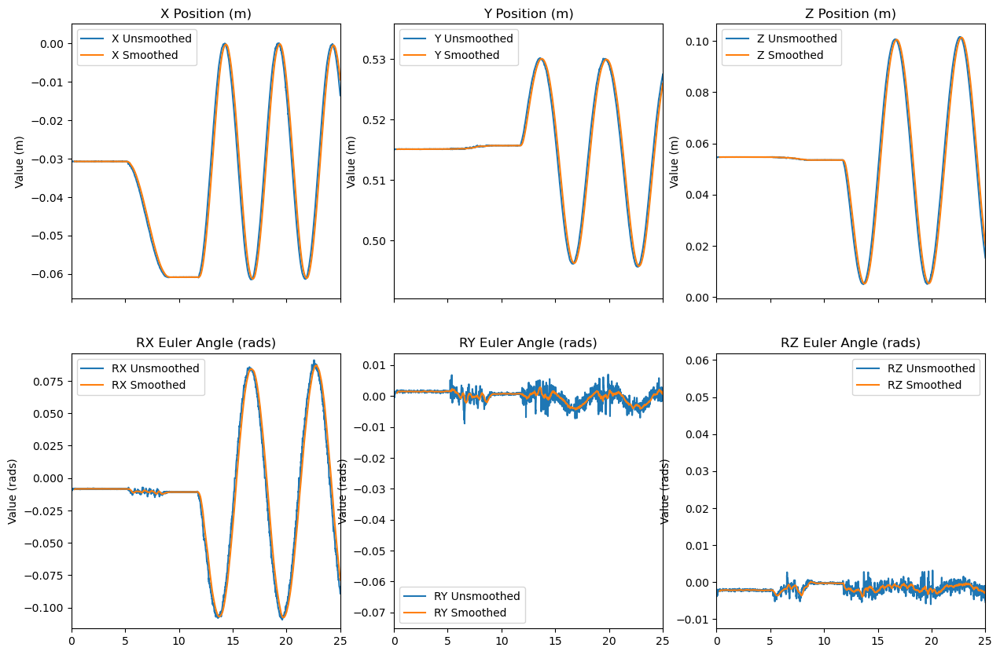

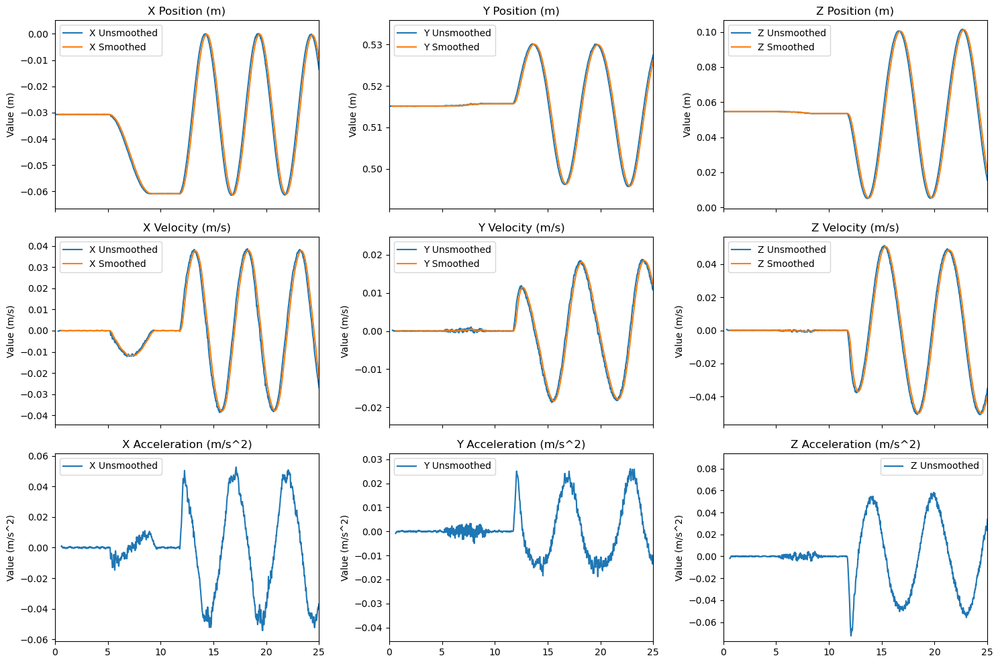

Number of data points in file : 14554
Data from Train_data_20.csv for left_rear
Plot for left_rear :


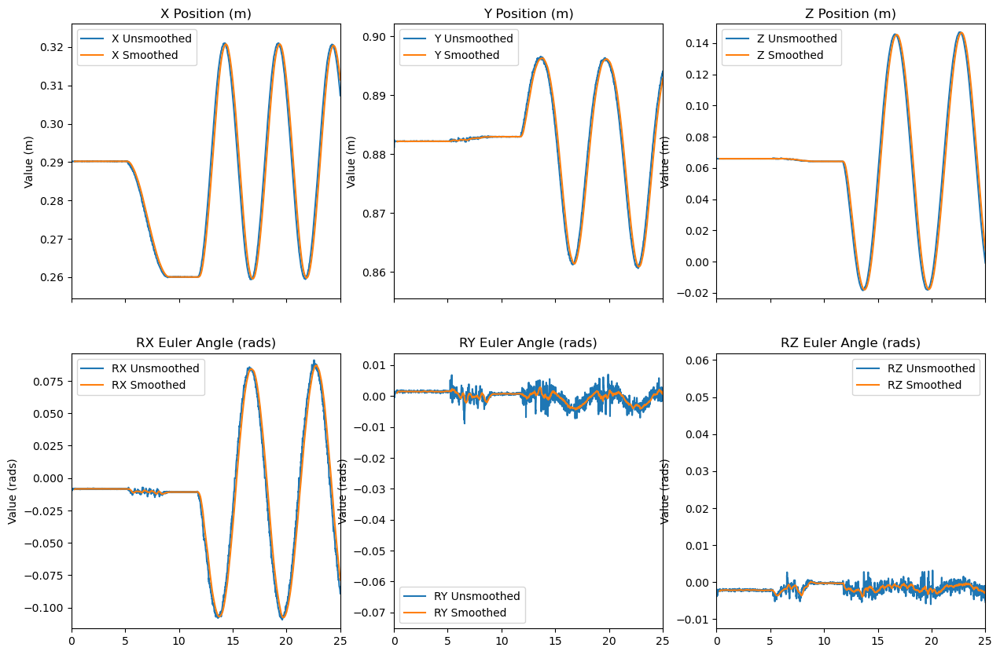

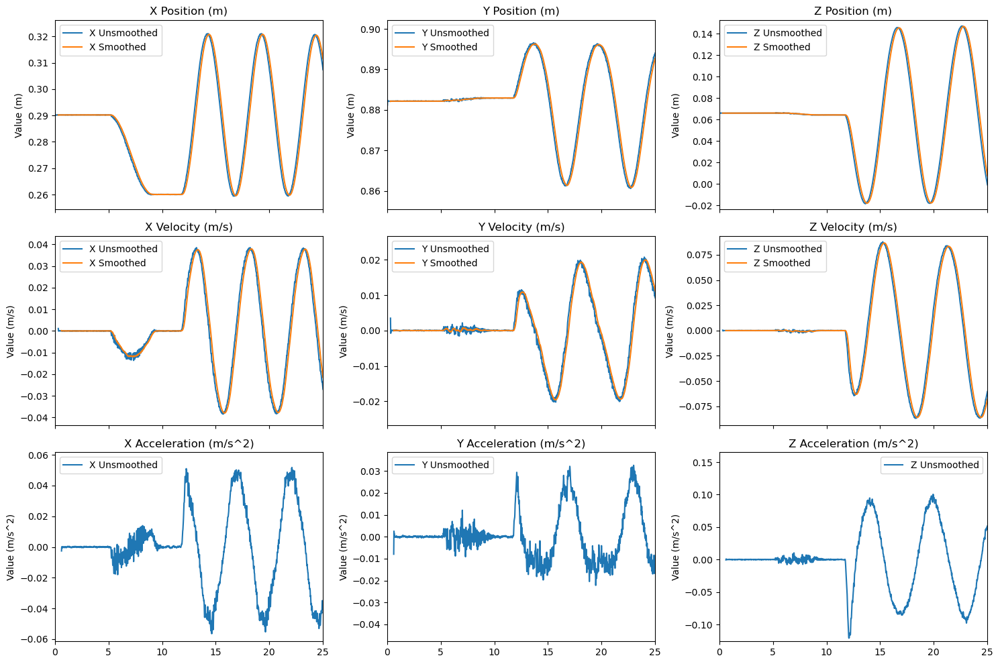

Number of data points in file : 14554
Data from Train_data_20.csv for right_rear
Plot for right_rear :


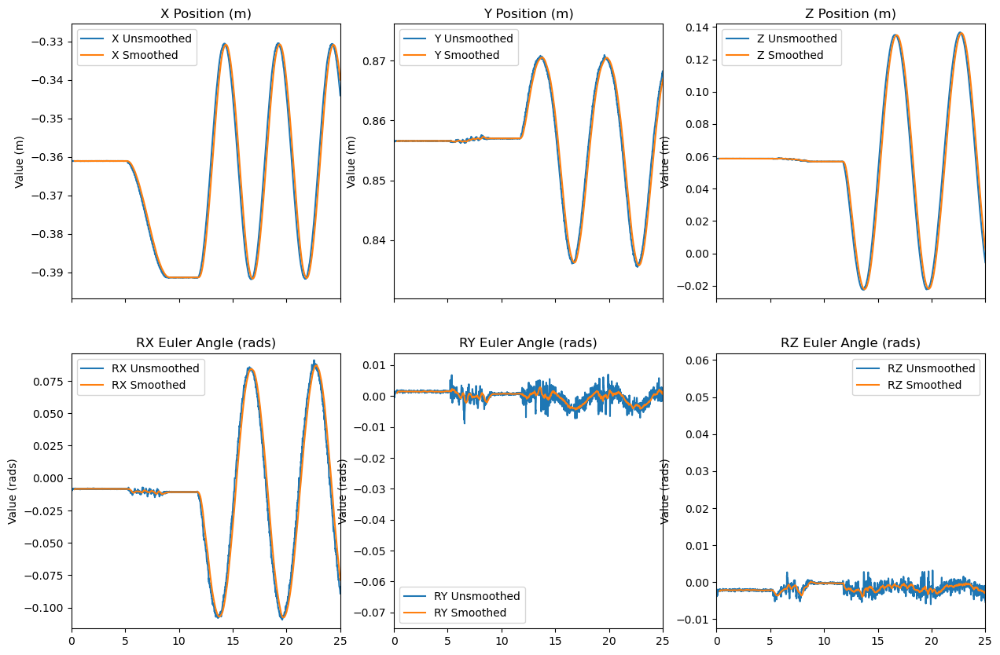

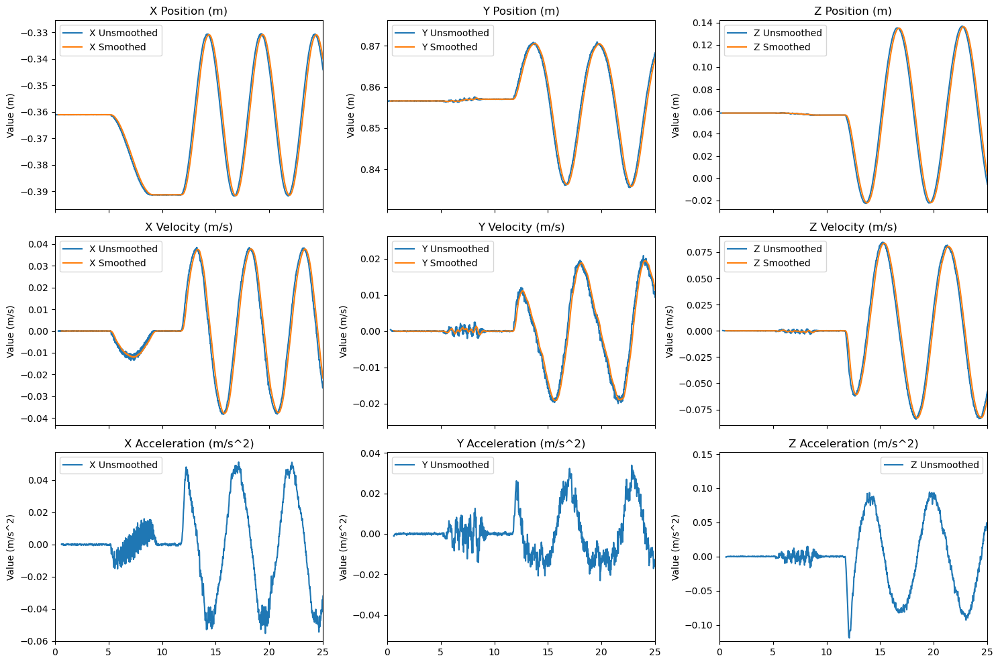

Number of data points in file : 14554
Data from Train_data_29.csv for front
Plot for front :


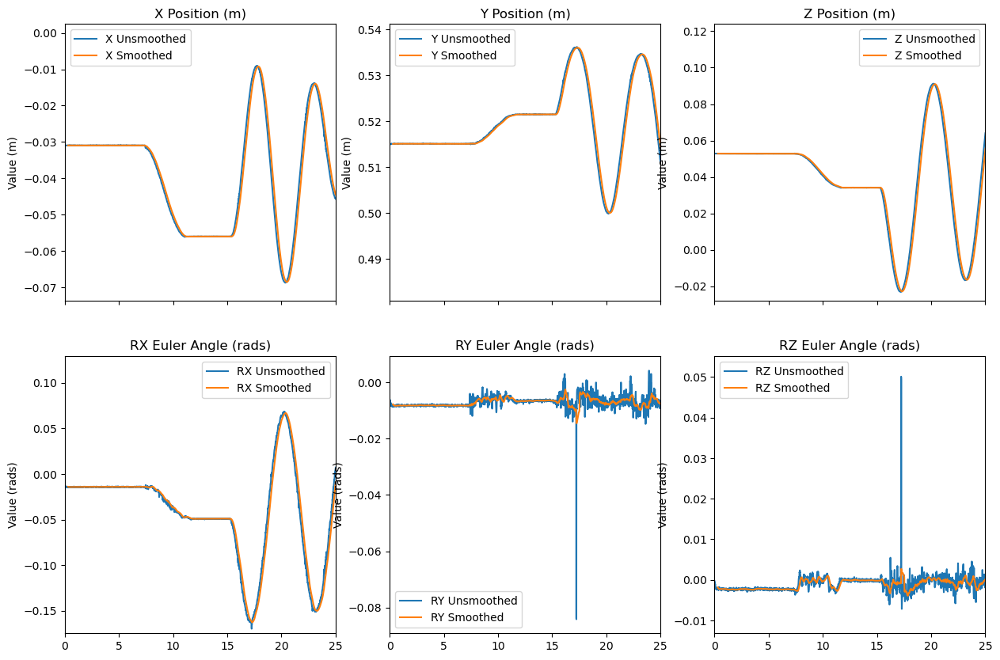

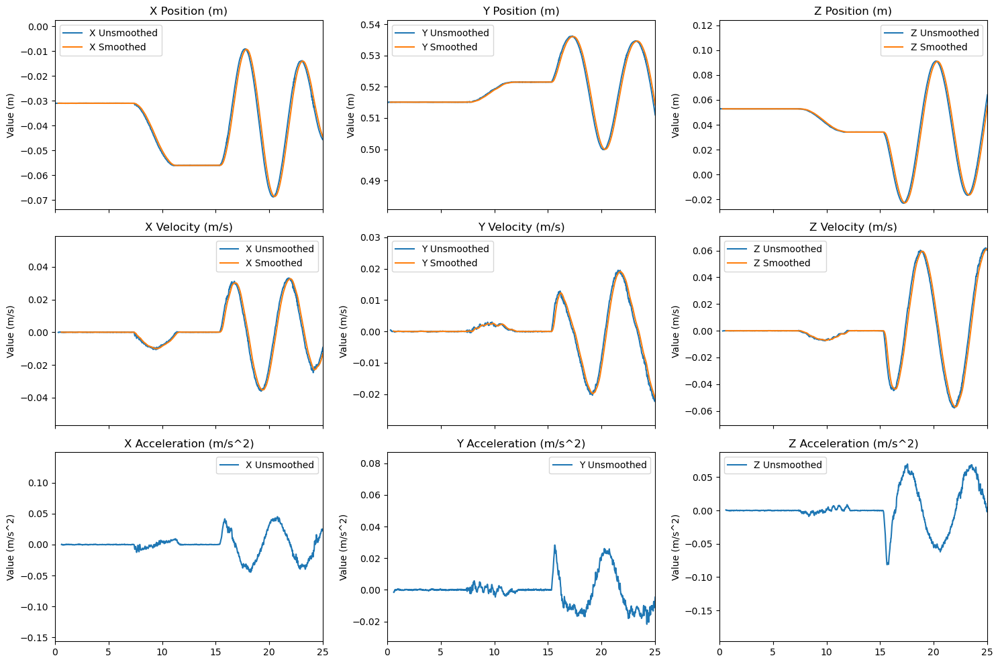

Number of data points in file : 15084
Data from Train_data_29.csv for left_rear
Plot for left_rear :


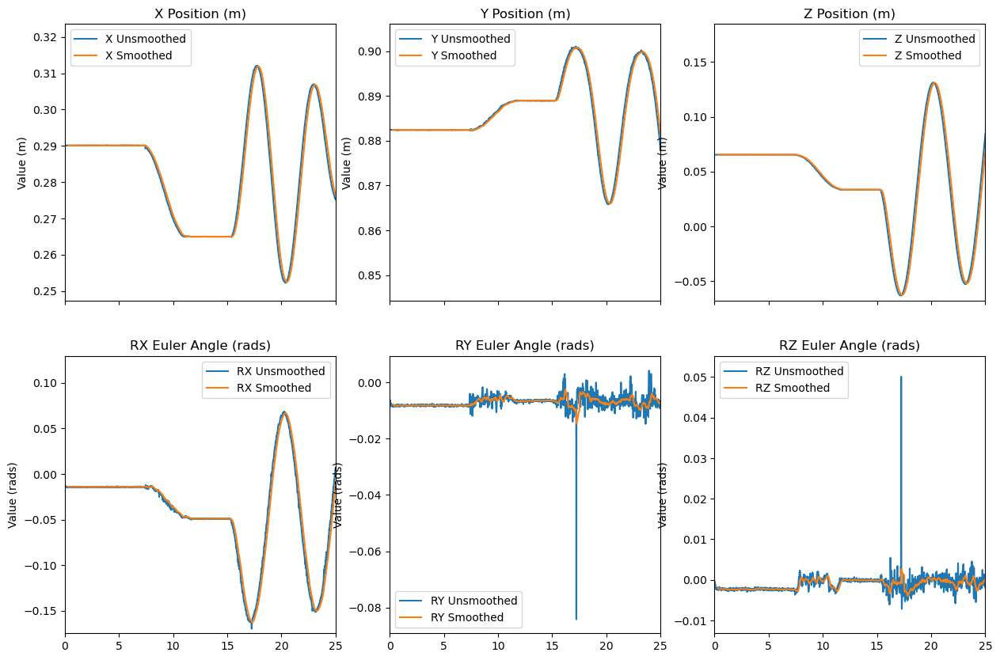

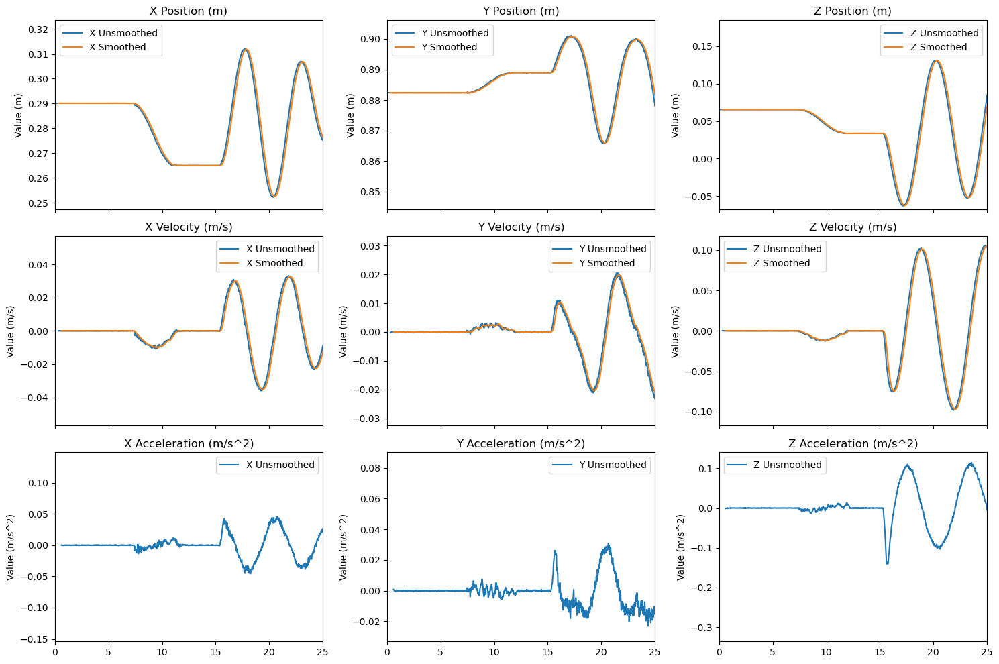

Number of data points in file : 15084
Data from Train_data_29.csv for right_rear
Plot for right_rear :


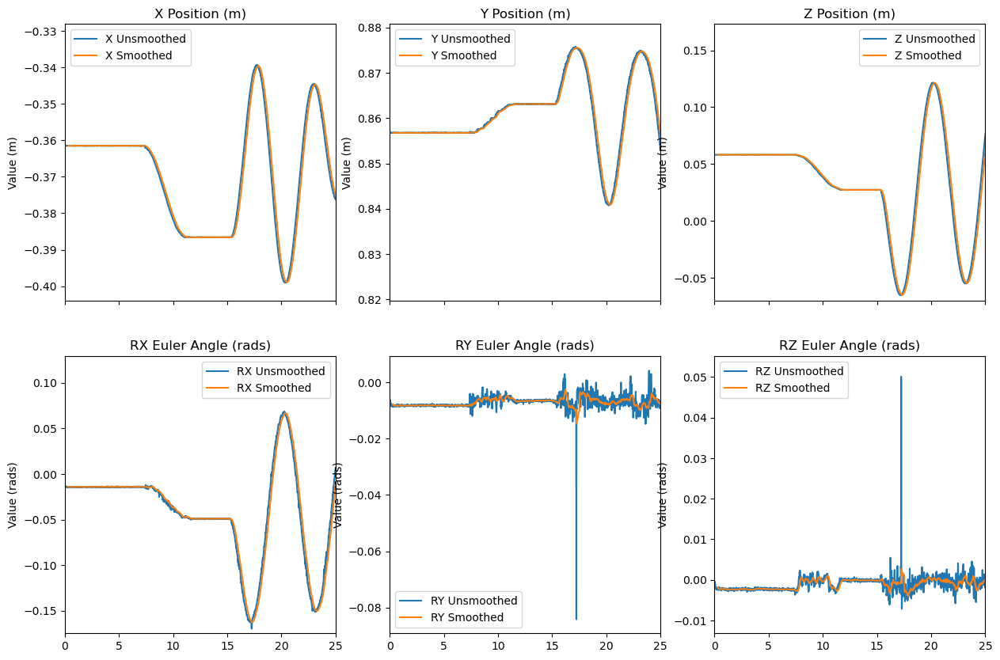

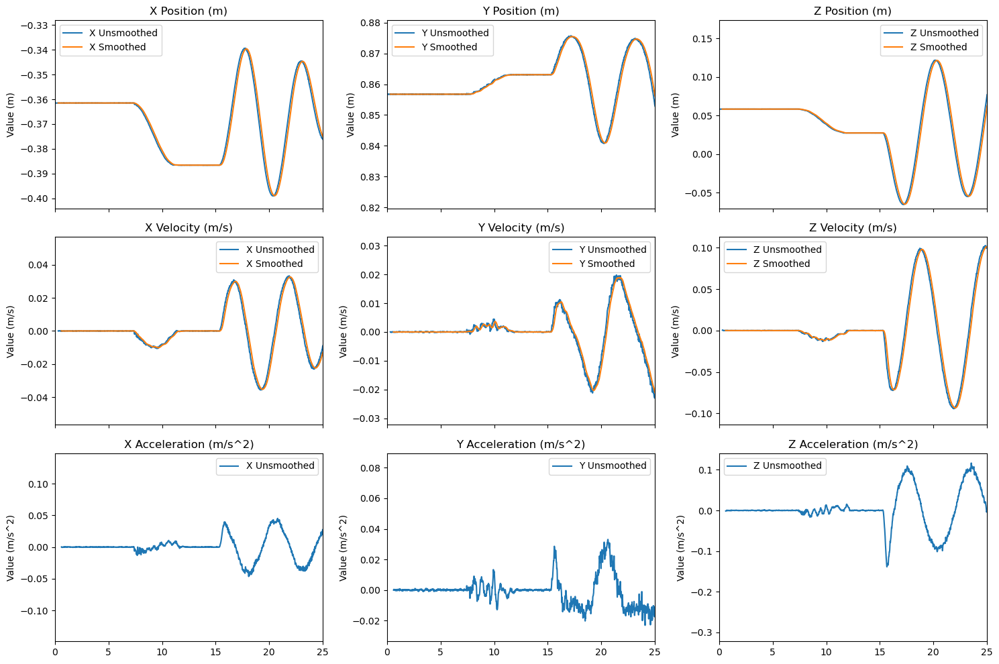

Number of data points in file : 15084
Data from Train_data_17.csv for front
Plot for front :


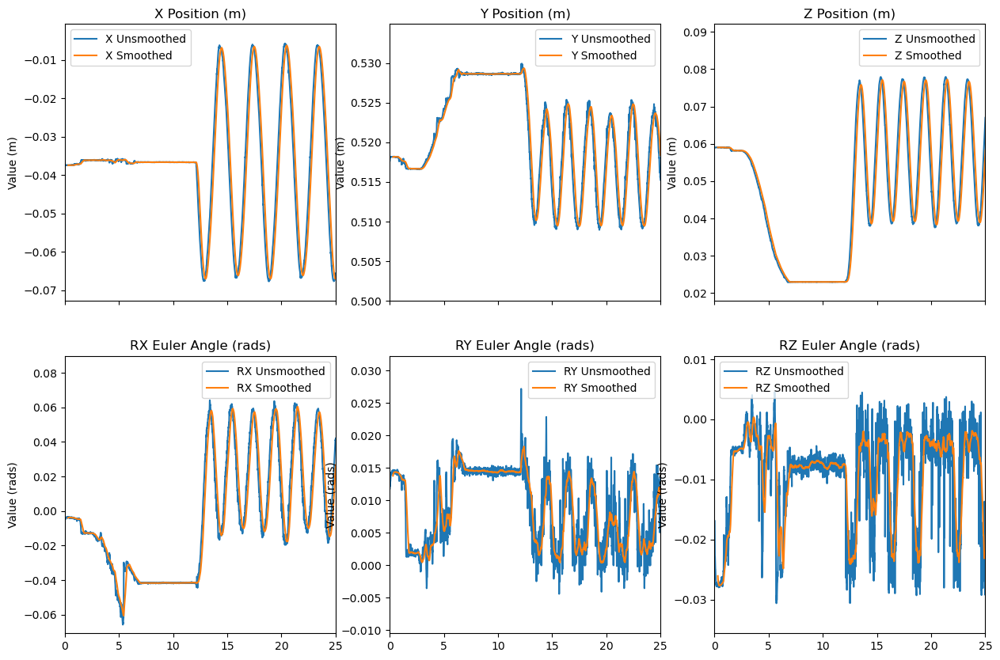

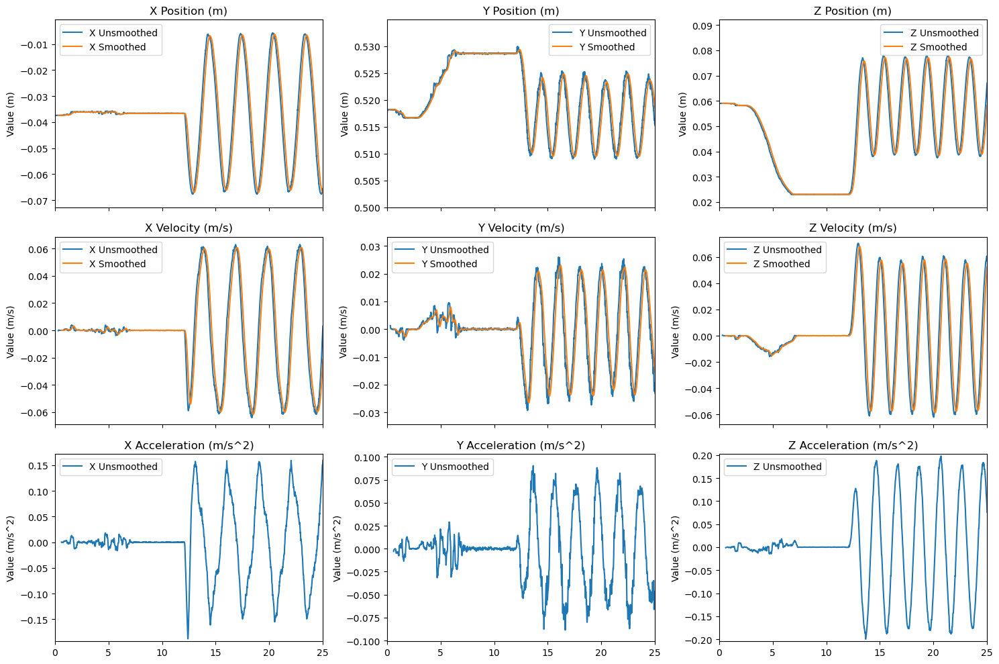

Number of data points in file : 14226
Data from Train_data_17.csv for left_rear
Plot for left_rear :


KeyboardInterrupt: 

In [2]:
#Ensure to run rename current first
import os
import pandas as pd
from datetime import datetime
import math
import re
import json
import numpy as np
from scipy.signal import savgol_filter
from scipy.spatial.transform import Rotation
import math
import matplotlib.pyplot as plt
import time
from scipy.ndimage import gaussian_filter


## Function that converts euler angles to quaternions
def euler_to_quaternion(row):
    rot = Rotation.from_euler('xyz', row, degrees=False)
    quat = rot.as_quat()
    return pd.Series(quat)

## Function that saves the numpy file
def save_numpy_file(data_frame, directory, filename):
    np.save(f"{directory}/{filename}.npy", data_frame)

formatted_data_folder = 'FORMATTED_DATA_V3'
ground_truth_folder = 'GT_11_8'
sample_dir = 'SAMPLE_RESULT'
freq_VICON = 100

for gt_file in os.listdir(ground_truth_folder):
    trial_number = re.findall(r'\d+', gt_file)[0]
    gt_path = os.path.join(ground_truth_folder, gt_file)
    
    if int(trial_number) >= 0:
        # Open the CSV file and read all lines
        with open(gt_path) as file:
            lines = file.readlines()

        # Find the line index where "Model Outputs" app
        start_index = None
        end_index = None
        for i, line in enumerate(lines):
            if "Model Outputs" in line:
                start_index = i + 2  # Assuming data starts right after this line
            if "Segments" in line:
                end_index = i - 2

        #Determines read domain
        read_domain = end_index - start_index

        # Read the data from the starting point
        gt_data = pd.read_csv(gt_path, skiprows=start_index,nrows= read_domain,index_col=False)
        gt_data = gt_data.drop(columns=gt_data.columns[1])

        # Gets time and converts it to microseconds
        gt_time = gt_data.iloc[2:,0].astype(float)/freq_VICON
        gt_time = gt_time * (1e6)
        gt_time.name = "Time (us)"


        gt_headers = gt_data.columns.tolist()
        # Gets the names of each segement/cord in the Mocap file
        base_names = [header.split(":")[1].strip().replace("_cord", "") for header in gt_headers if "Unnamed" not in str(header)]
        base_loc = [index for index, header in enumerate(gt_headers) if "Unnamed" not in str(header)]


        for i, name in enumerate(base_names):
            print(f"Data from {gt_file} for {base_names[i]}")
            # Gets euler angle data from the MOCAP
            gt_rpy = gt_data.iloc[2:,base_loc[i]:base_loc[i]+3].astype('float64') * math.pi / 180
            gt_rpy.columns = ['RX (rads)', 'RY (rads)', 'RY (rads)']

            # Gets the position data from the MOCAP
            gt_xyz = gt_data.iloc[2:,base_loc[i]+3:base_loc[i]+6].astype('float64') * 1e-3
            gt_xyz.columns = ['TX (m)', 'TY (m)', 'TZ (m)']


            # Apply moving average filter on raw data for smoothing 
            window_size = 30  # You can adjust this value to change the window size of the moving average
            gt_rpy_smooth = gt_rpy.rolling(window=window_size).mean()
            gt_xyz_smooth = gt_xyz.rolling(window=window_size).mean()

            # Converts back to seconds for plotting purposes and derivative calculations
            gt_time_sec = gt_time/1e6

            # Determine angluar velocity by taking derivative
            gt_wx_wy_wz = gt_rpy_smooth.apply(lambda x: np.gradient(x,gt_time_sec))
            gt_wx_wy_wz.columns = ['wX (rads/s)', 'wY (rads/s)', 'wZ (rads/s)']

            # Determine velocity by taking derivative
            gt_vx_vy_vz = gt_xyz_smooth.apply(lambda x: np.gradient(x,gt_time_sec))
            gt_vx_vy_vz.columns = ['VX (m/s)', 'VY (m/s)', 'VZ (m/s)']
            gt_vx_vy_vz_smooth = gt_vx_vy_vz.rolling(window=window_size).mean() # Smooth is reapplied as another derivative needs to be taken here

            # Determine acceleration by taking derivative
            gt_ax_ay_az = gt_vx_vy_vz_smooth.apply(lambda x: np.gradient(x,gt_time_sec))
            gt_ax_ay_az.columns = ['aX (m/s^2)', 'aY (m/s^2)', 'aZ (m/s^2)']

            # Applys euler to quaternion conversion
            gt_qx_qy_qz = gt_rpy.apply(euler_to_quaternion, axis=1)
            gt_qx_qy_qz.columns = ['qX', 'qY', 'qZ', 'qW'] 

            
            #Plots for verifying whether smoothing and derivatives seem accurate.
            print(f"Plot for {base_names[i]} :")
            fig, axs = plt.subplots(2, 3, figsize=(15, 10), sharex=True)
            time_interval = 25
            del_lim = 0.005
            # Position plots
            axs[0, 0].plot(gt_time_sec, gt_xyz.iloc[:, 0], label='X Unsmoothed')
            axs[0, 0].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 0], label='X Smoothed')
            axs[0, 0].set_title('X Position (m)')
            axs[0, 0].set_ylabel('Value (m)')
            axs[0, 0].legend()
            axs[0, 0].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 0].max(), gt_xyz_smooth.iloc[:, 0].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 0].min(), gt_xyz_smooth.iloc[:, 0].min()) - del_lim
            axs[0, 0].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs[0, 1].plot(gt_time_sec, gt_xyz.iloc[:, 1], label='Y Unsmoothed')
            axs[0, 1].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 1], label='Y Smoothed')
            axs[0, 1].set_title('Y Position (m)')
            axs[0, 1].set_ylabel('Value (m)')
            axs[0, 1].legend()
            axs[0, 1].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 1].max(), gt_xyz_smooth.iloc[:, 1].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 1].min(), gt_xyz_smooth.iloc[:, 1].min()) - del_lim
            axs[0, 1].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs[0, 2].plot(gt_time_sec, gt_xyz.iloc[:, 2], label='Z Unsmoothed')
            axs[0, 2].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 2], label='Z Smoothed')
            axs[0, 2].set_title('Z Position (m)')
            axs[0, 2].set_ylabel('Value (m)')
            axs[0, 2].legend()
            axs[0, 2].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 2].max(), gt_xyz_smooth.iloc[:, 2].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 2].min(), gt_xyz_smooth.iloc[:, 2].min()) - del_lim
            axs[0, 2].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            # Euler angle plots
            axs[1, 0].plot(gt_time_sec, gt_rpy.iloc[:, 0], label='RX Unsmoothed')
            axs[1, 0].plot(gt_time_sec, gt_rpy_smooth.iloc[:, 0], label='RX Smoothed')
            axs[1, 0].set_title('RX Euler Angle (rads)')
            axs[1, 0].set_ylabel('Value (rads)')
            axs[1, 0].legend()
            axs[1, 0].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_rpy.iloc[:, 0].max(), gt_rpy_smooth.iloc[:, 0].max()) + del_lim
            y_min = min(gt_rpy.iloc[:, 0].min(), gt_rpy_smooth.iloc[:, 0].min()) - del_lim
            axs[1, 0].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs[1, 1].plot(gt_time_sec, gt_rpy.iloc[:, 1], label='RY Unsmoothed')
            axs[1, 1].plot(gt_time_sec, gt_rpy_smooth.iloc[:, 1], label='RY Smoothed')
            axs[1, 1].set_title('RY Euler Angle (rads)')
            axs[1, 1].set_ylabel('Value (rads)')
            axs[1, 1].legend()
            axs[1, 1].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_rpy.iloc[:, 1].max(), gt_rpy_smooth.iloc[:, 1].max()) + del_lim
            y_min = min(gt_rpy.iloc[:, 1].min(), gt_rpy_smooth.iloc[:, 1].min()) - del_lim
            axs[1, 1].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs[1, 2].plot(gt_time_sec, gt_rpy.iloc[:, 2], label='RZ Unsmoothed')
            axs[1, 2].plot(gt_time_sec, gt_rpy_smooth.iloc[:, 2], label='RZ Smoothed')
            axs[1, 2].set_title('RZ Euler Angle (rads)')
            axs[1, 2].set_ylabel('Value (rads)')
            axs[1, 2].legend()
            axs[1, 2].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_rpy.iloc[:, 2].max(), gt_rpy_smooth.iloc[:, 2].max()) + del_lim
            y_min = min(gt_rpy.iloc[:, 2].min(), gt_rpy_smooth.iloc[:, 2].min()) - del_lim
            axs[1, 2].set_ylim(y_min, y_max)  # Adjust y-limits dynamically



            fig2, axs2 = plt.subplots(3, 3, figsize=(15, 10), sharex=True)
            time_interval = 25
            del_lim = 0.005

            # Position plots
            axs2[0, 0].plot(gt_time_sec, gt_xyz.iloc[:, 0], label='X Unsmoothed')
            axs2[0, 0].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 0], label='X Smoothed')
            axs2[0, 0].set_title('X Position (m)')
            axs2[0, 0].set_ylabel('Value (m)')
            axs2[0, 0].legend()
            axs2[0, 0].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 0].max(), gt_xyz_smooth.iloc[:, 0].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 0].min(), gt_xyz_smooth.iloc[:, 0].min()) - del_lim
            axs2[0, 0].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[0, 1].plot(gt_time_sec, gt_xyz.iloc[:, 1], label='Y Unsmoothed')
            axs2[0, 1].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 1], label='Y Smoothed')
            axs2[0, 1].set_title('Y Position (m)')
            axs2[0, 1].set_ylabel('Value (m)')
            axs2[0, 1].legend()
            axs2[0, 1].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 1].max(), gt_xyz_smooth.iloc[:, 1].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 1].min(), gt_xyz_smooth.iloc[:, 1].min()) - del_lim
            axs2[0, 1].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[0, 2].plot(gt_time_sec, gt_xyz.iloc[:, 2], label='Z Unsmoothed')
            axs2[0, 2].plot(gt_time_sec, gt_xyz_smooth.iloc[:, 2], label='Z Smoothed')
            axs2[0, 2].set_title('Z Position (m)')
            axs2[0, 2].set_ylabel('Value (m)')
            axs2[0, 2].legend()
            axs2[0, 2].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_xyz.iloc[:, 2].max(), gt_xyz_smooth.iloc[:, 2].max()) + del_lim
            y_min = min(gt_xyz.iloc[:, 2].min(), gt_xyz_smooth.iloc[:, 2].min()) - del_lim
            axs2[0, 2].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            # Velocity plots
            axs2[1, 0].plot(gt_time_sec, gt_vx_vy_vz.iloc[:, 0], label='X Unsmoothed')
            axs2[1, 0].plot(gt_time_sec, gt_vx_vy_vz_smooth.iloc[:, 0], label='X Smoothed')
            axs2[1, 0].set_title('X Velocity (m/s)')
            axs2[1, 0].set_ylabel('Value (m/s)')
            axs2[1, 0].legend()
            axs2[1, 0].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_vx_vy_vz.iloc[:, 0].max(), gt_vx_vy_vz_smooth.iloc[:, 0].max()) + del_lim
            y_min = min(gt_vx_vy_vz.iloc[:, 0].min(), gt_vx_vy_vz_smooth.iloc[:, 0].min()) - del_lim
            axs2[1, 0].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[1, 1].plot(gt_time_sec, gt_vx_vy_vz.iloc[:, 1], label='Y Unsmoothed')
            axs2[1, 1].plot(gt_time_sec, gt_vx_vy_vz_smooth.iloc[:, 1], label='Y Smoothed')
            axs2[1, 1].set_title('Y Velocity (m/s)')
            axs2[1, 1].set_ylabel('Value (m/s)')
            axs2[1, 1].legend()
            axs2[1, 1].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_vx_vy_vz.iloc[:, 1].max(), gt_vx_vy_vz_smooth.iloc[:, 1].max()) + del_lim
            y_min = min(gt_vx_vy_vz.iloc[:, 1].min(), gt_vx_vy_vz_smooth.iloc[:, 1].min()) - del_lim
            axs2[1, 1].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[1, 2].plot(gt_time_sec, gt_vx_vy_vz.iloc[:, 2], label='Z Unsmoothed')
            axs2[1, 2].plot(gt_time_sec, gt_vx_vy_vz_smooth.iloc[:, 2], label='Z Smoothed')
            axs2[1, 2].set_title('Z Velocity (m/s)')
            axs2[1, 2].set_ylabel('Value (m/s)')
            axs2[1, 2].legend()
            axs2[1, 2].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = max(gt_vx_vy_vz.iloc[:, 2].max(), gt_vx_vy_vz_smooth.iloc[:, 2].max()) + del_lim
            y_min = min(gt_vx_vy_vz.iloc[:, 2].min(), gt_vx_vy_vz_smooth.iloc[:, 2].min()) - del_lim
            axs2[1, 2].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            # Acceleration plots
            axs2[2, 0].plot(gt_time_sec, gt_ax_ay_az.iloc[:, 0], label='X Unsmoothed')
            axs2[2, 0].set_title('X Acceleration (m/s^2)')
            axs2[2, 0].set_ylabel('Value (m/s^2)')
            axs2[2, 0].legend()
            axs2[2, 0].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = gt_ax_ay_az.iloc[:, 0].max() + del_lim
            y_min = gt_ax_ay_az.iloc[:, 0].min() - del_lim
            axs2[2, 0].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[2, 1].plot(gt_time_sec, gt_ax_ay_az.iloc[:,  1], label='Y Unsmoothed')
            axs2[2, 1].set_title('Y Acceleration (m/s^2)')
            axs2[2, 1].set_ylabel('Value (m/s^2)')
            axs2[2, 1].legend()
            axs2[2, 1].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = gt_ax_ay_az.iloc[:, 1].max() + del_lim
            y_min = gt_ax_ay_az.iloc[:, 1].min() - del_lim
            axs2[2, 1].set_ylim(y_min, y_max)  # Adjust y-limits dynamically

            axs2[2, 2].plot(gt_time_sec, gt_ax_ay_az.iloc[:, 2], label='Z Unsmoothed')
            axs2[2, 2].set_title('Z Acceleration (m/s^2)')
            axs2[2, 2].set_ylabel('Value (m/s^2)')
            axs2[2, 2].legend()
            axs2[2, 2].set_xlim(0, time_interval)  # Plot only the first 25 seconds
            y_max = gt_ax_ay_az.iloc[:, 2].max() + del_lim
            y_min = gt_ax_ay_az.iloc[:, 2].min() - del_lim
            axs2[2, 2].set_ylim(y_min, y_max)  # Adjust y-limits dynamically


            plt.tight_layout()
            plt.show()



            # Creates new data frame with the final formatted data
            gt_formatted = pd.concat([
                gt_time.to_frame(),
                gt_wx_wy_wz,
                gt_ax_ay_az,
                gt_qx_qy_qz,
                gt_xyz,
                gt_vx_vy_vz
            ], axis=1)
            
            # Determines the variables that would be in the JSON file describing the IMU
            num_rows = gt_formatted.shape[0]

            print(f"Number of data points in file : {num_rows}")
            
            # Replaces column names with column index as required by the TLIO format
            gt_formatted_final = pd.DataFrame(gt_formatted.values, columns=[str(i) for i in range(gt_formatted.shape[1])])
            
            # # Saves the formatted data to a numpy file
            # formatted_folder = f"data_{base_names[i]}_{trial_number}"
            # formatted_path = os.path.join(formatted_data_folder, formatted_folder)
            # if not os.path.exists(formatted_path):
            #     os.makedirs(formatted_path)
            # save_numpy_file(gt_formatted_final,formatted_path,"imu0_resampled")
